Loading CSV...
Counting usage and wins...
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered normal evolution level
Encountered n

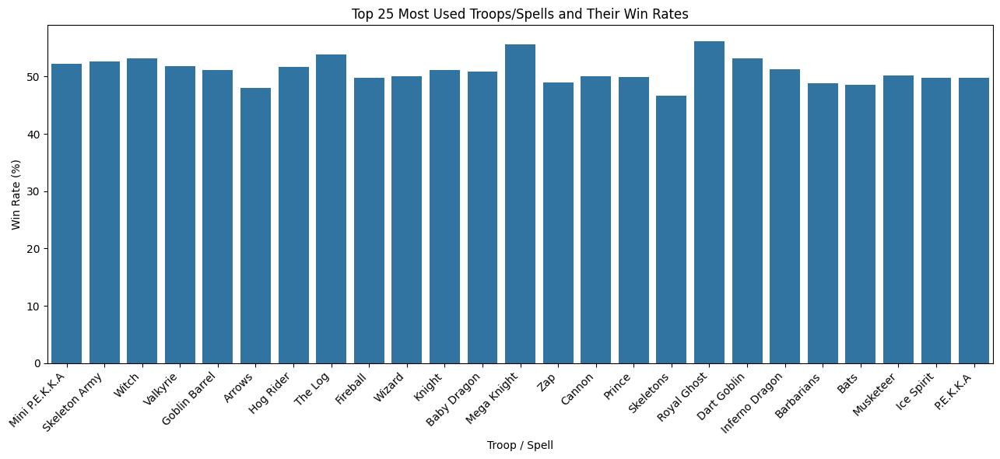

✅ Done. Top troops by usage:
      spell_normal  total_used  win_count   win_rate
6   Mini P.E.K.K.A       17659       9227  52.250977
22   Skeleton Army       17208       9062  52.661553
2            Witch       14949       7954  53.207572
8         Valkyrie       12682       6574  51.837250
17   Goblin Barrel       12188       6238  51.181490
7           Arrows       11734       5640  48.065451
0        Hog Rider       11604       6000  51.706308
55         The Log       11602       6242  53.801069
35        Fireball       10959       5448  49.712565
32          Wizard       10545       5274  50.014225
21          Knight        9966       5095  51.123821
5      Baby Dragon        9670       4917  50.847983
75     Mega Knight        9418       5243  55.669994
87             Zap        7257       3556  49.000965
34          Cannon        7105       3560  50.105559
3           Prince        6748       3368  49.911085
33       Skeletons        6472       3020  46.662546
45     Royal Ghos

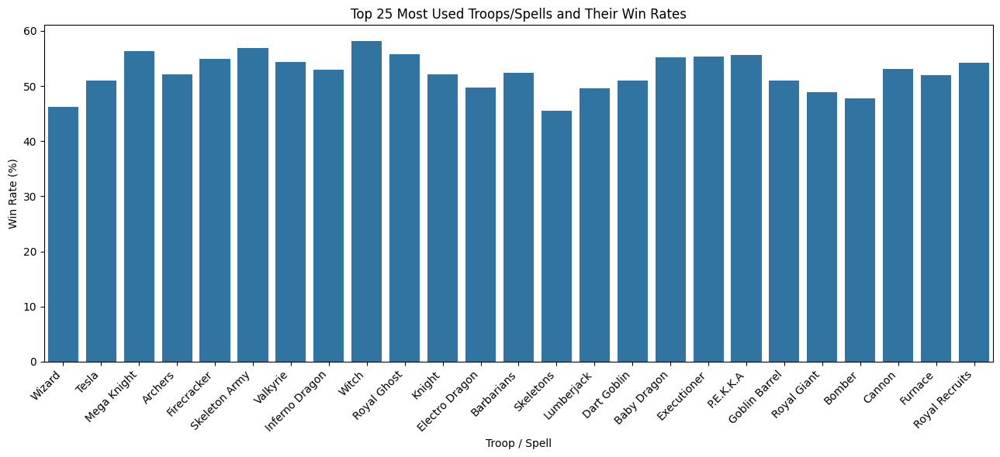

✅ Done. Top troops by usage:
         spell_evo  total_used  win_count   win_rate
1           Wizard        2526       1168  46.239113
0            Tesla        2260       1153  51.017699
13     Mega Knight        2037       1149  56.406480
18         Archers        1948       1016  52.156057
7      Firecracker        1504        826  54.920213
4    Skeleton Army        1422        810  56.962025
20        Valkyrie        1420        773  54.436620
21  Inferno Dragon        1404        744  52.991453
22           Witch        1255        730  58.167331
10     Royal Ghost        1253        699  55.786113
9           Knight        1037        541  52.169720
19  Electro Dragon         844        420  49.763033
12      Barbarians         781        409  52.368758
11       Skeletons         768        350  45.572917
14      Lumberjack         739        367  49.661705
24     Dart Goblin         678        346  51.032448
30     Baby Dragon         664        367  55.271084
6      Executione

In [ ]:
import pandas as pd
import re
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# --- CONFIG ---
FILE_PATH = "../#2 Data Storage/Processed Data/preprocessed_battle_log.csv"
TOP_N = 25
# --------------

print("Loading CSV...")
df = pd.read_csv(FILE_PATH, usecols=[
    'players_0_spells', 'players_0_winner',
    'players_1_spells', 'players_1_winner'
])

# Merge both players’ spells and win info
p0 = df[['players_0_spells', 'players_0_winner']].rename(
    columns={'players_0_spells': 'spells', 'players_0_winner': 'winner'}
)
p1 = df[['players_1_spells', 'players_1_winner']].rename(
    columns={'players_1_spells': 'spells', 'players_1_winner': 'winner'}
)
players = pd.concat([p0, p1], ignore_index=True)
del df, p0, p1

# --- Regex to extract troop/spell names ---
# Example string: "[('Royal Ghost', 11, 1), ('Hog Rider', 11, 0)]"
def parse_spells(s):

    # Primary: safe eval of Python literal
    try:
        pattern = re.compile(r"\('([^']+)'\s*,\s*([0-9]+)(?:\s*,\s*([0-9]+))?")
        matches = pattern.findall(s)
        return [(m[0], int(m[2]) if m[2] else None) for m in matches]

    except Exception as e:
        print(e)
        return []


# --- Count occurrences and wins efficiently ---
print("Counting usage and wins...")
use_counter = Counter()
win_counter = Counter()
use_evo_counter = Counter()
win_evo_counter = Counter()

for spells, win in zip(players['spells'], players['winner']):
    spells_list = parse_spells(spells)
    for spell in spells_list:
        name = spell[0]
        evo = spell[1]
        if evo == 1:
            use_evo_counter[name] += 1
            use_counter[name] += 1
            if win == 1 or win is True:
                win_evo_counter[name] += 1
                win_counter[name] += 1
        else:
            use_counter[name] += 1
            if win == 1 or win is True:
                win_counter[name] += 1

# --- Build DataFrame Normal---
troop_stats_normal = pd.DataFrame({
    'spell_normal': list(use_counter.keys()),
    'total_used': list(use_counter.values()),
    'win_count': [win_counter[s] for s in use_counter]})

troop_stats_normal['win_rate'] = troop_stats_normal['win_count'] / troop_stats_normal['total_used'] * 100
troop_stats_normal = troop_stats_normal.sort_values('total_used', ascending=False)


# --- Plot ---
top = troop_stats_normal.head(TOP_N)
plt.figure(figsize=(13, 6))
sns.barplot(data=top, x='spell_normal', y='win_rate')
plt.title(f"Top {TOP_N} Most Used Troops/Spells and Their Win Rates")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Troop / Spell")
plt.ylabel("Win Rate (%)")
plt.tight_layout()
plt.show()

print("✅ Done. Top troops by usage:")
print(troop_stats_normal.head(TOP_N))

# --- Build DataFrame Evo---
troop_stats_evo = pd.DataFrame({
    'spell_evo': list(use_evo_counter.keys()),
    'total_used': list(use_evo_counter.values()),
    'win_count': [win_evo_counter[s] for s in use_evo_counter]})

troop_stats_evo['win_rate'] = troop_stats_evo['win_count'] / troop_stats_evo['total_used'] * 100
troop_stats_evo = troop_stats_evo.sort_values('total_used', ascending=False)
# --- Plot ---
top = troop_stats_evo.head(TOP_N)
plt.figure(figsize=(13, 6))
sns.barplot(data=top, x='spell_evo', y='win_rate')
plt.title(f"Top {TOP_N} Most Used Troops/Spells and Their Win Rates")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Troop / Spell")
plt.ylabel("Win Rate (%)")
plt.tight_layout()
plt.show()

print("✅ Done. Top troops by usage:")
print(troop_stats_evo.head(TOP_N))


In [7]:
troop_stats_evo

,spell_evo,total_used,win_count,win_rate
54,"(Barbarian Barrel, 0)",27,12,44.444444
55,"(Arrows, 0)",21,10,47.619048
53,"(Electro Spirit, 0)",19,10,52.631579
49,"(Goblin Cage, 1)",17,11,64.705882
50,"(Royal Hogs, 0)",17,9,52.941176
...,...,...,...,...
113,"(Inferno Tower, 0)",1,1,100.000000
114,"(Knight, 0)",1,0,0.000000
115,"(Inferno Dragon, 0)",1,0,0.000000
116,"(Bomber, 0)",1,0,0.000000


In [ ]:
df = pd.read_csv(FILE_PATH)
df.head()

,replayTag,arena,game_config_name,players_0_avgManaCost,players_0_hashtag,players_0_score,players_0_stars,players_0_winner,players_0_elixirLeaked,players_0_supportCards,...,players_1_avgManaCost,players_1_hashtag,players_1_score,players_1_stars,players_1_winner,players_1_elixirLeaked,players_1_spells,players_1_supportCards,players_1_kingTowerHitPoints,players_1_princessTowersHitPoints
0,08V9C9CLGLC9,54000124,DraftMode_Princess,3.75,2G2L9PRUP,0,3,1,2.32,"[('Tower Princess', 11, 'common')]",...,4.25,PL802VYQC,0,0,-1,7.34,"[('Royal Ghost', 11, 1), ('Royal Giant', 11, 0...","[('Tower Princess', 11, 'common')]",0,NaN
1,08YPGPGR0Q8G,54000124,DraftMode_Princess,3.50,2G2L9PRUP,0,1,1,1.60,"[('Tower Princess', 11, 'common')]",...,3.63,Y90CR0Q2Q,0,0,-1,0.00,"[('Knight', 11, 1), ('Ram Rider', 11, 0), ('Wa...","[('Tower Princess', 11, 'common')]",4824,[588]
2,09L9J8VPYQ2V,54000124,Showdown_Friendly,2.88,2G2L9PRUP,0,1,1,4.18,"[('Tower Princess', 11, 'common')]",...,3.25,GPYL9VL0,0,0,-1,5.18,"[('Tesla', 11, 1), ('Giant Snowball', 11, 1), ...","[('Tower Princess', 11, 'common')]",4782,[2848]
3,08PPG9VQ29LL,54000031,CW_Battle_1v1,4.50,2G2L9PRUP,10000,1,1,3.45,[],...,4.25,28GPLP98J,10000,0,-1,2.96,"[('Goblin Giant', 15, 1), ('Mega Knight', 15, ...",[],7032,[4424]
4,00QPJQL0C9CY,54000031,CW_Battle_1v1,2.75,2G2L9PRUP,10000,3,1,0.50,[],...,3.50,2PVYGP8R2,10000,0,-1,13.81,"[('Knight', 15, 1), ('Tesla', 15, 1), ('X-Bow'...",[],0,NaN


In [ ]:
df.describe()

,arena,players_0_avgManaCost,players_0_score,players_0_stars,players_0_winner,players_0_elixirLeaked,players_0_kingTowerHitPoints,players_1_avgManaCost,players_1_score,players_1_stars,players_1_winner,players_1_elixirLeaked,players_1_kingTowerHitPoints
count,3.100000e+01,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,5.400011e+07,3.444839,2173.870968,1.096774,0.548387,3.459032,5699.387097,3.570645,2172.612903,0.354839,-0.548387,4.287419,4801.935484
std,3.169227e+01,0.509613,3179.943299,0.943569,0.850047,3.086580,1570.173487,0.551210,3180.116074,0.709384,0.850047,4.082567,2576.376292
min,5.400003e+07,2.630000,0.000000,0.000000,-1.000000,0.000000,0.000000,2.630000,0.000000,0.000000,-1.000000,0.000000,0.000000
25%,5.400012e+07,3.000000,8.500000,1.000000,1.000000,1.245000,4824.000000,3.190000,6.500000,0.000000,-1.000000,1.730000,4428.500000
50%,5.400012e+07,3.750000,1800.000000,1.000000,1.000000,2.960000,5771.000000,3.500000,1795.000000,0.000000,-1.000000,2.960000,5692.000000
75%,5.400012e+07,3.750000,1843.000000,1.000000,1.000000,4.355000,7032.000000,4.000000,1846.500000,0.500000,-1.000000,5.945000,7032.000000
max,5.400012e+07,4.500000,10000.000000,3.000000,1.000000,11.710000,7032.000000,4.630000,10000.000000,3.000000,1.000000,16.410000,7032.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31 entries, 0 to 30
Data columns (total 23 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   replayTag                          31 non-null     object 
 1   arena                              31 non-null     int64  
 2   game_config_name                   31 non-null     object 
 3   players_0_avgManaCost              31 non-null     float64
 4   players_0_hashtag                  31 non-null     object 
 5   players_0_score                    31 non-null     int64  
 6   players_0_stars                    31 non-null     int64  
 7   players_0_winner                   31 non-null     int64  
 8   players_0_elixirLeaked             31 non-null     float64
 9   players_0_supportCards             31 non-null     object 
 10  players_0_spells                   31 non-null     object 
 11  players_0_kingTowerHitPoints       31 non-null     int64  
 